In [1]:
#Muhammad Daffa Saifullah
#1103204024
#UTS Machine Learning
#library eda
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
# import ydata_profiling as pp
# from ydata_profiling import ProfileReport
# import folium
# import keplergl
# import dtale
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
pd.options.display.float_format = '{:20,.2f}'.format
pd.options.plotting.backend = 'plotly'

library diatas adalah library untuk eda (Visualisasi dll)

In [2]:
#ml library
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
# from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

library diatas adalah untuk machine learning

# Tambah file

In [3]:
df = pd.read_csv(r"C:\Users\daffa\OneDrive\Documents\Kuliah\Semester 6\KP\WA_Fn-UseC_-Telco-Customer-Churn.csv")

In [4]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


untuk membaca data dan menampilkan 5 data terawal

In [6]:
l1 = [len(i.split()) for i in df['TotalCharges']]
l2 = [i for i in range(len(l1)) if l1[i] != 1]
print('Index Positions with empty spaces : ',*l2)

for i in l2:
    df.loc[i,'TotalCharges'] = df.loc[(i-1),'TotalCharges']
    
df['TotalCharges'] = df['TotalCharges'].astype(float)
df.drop(columns = ['customerID'], inplace = True)

Index Positions with empty spaces :  488 753 936 1082 1340 3331 3826 4380 5218 6670 6754


Kode tersebut melakukan beberapa langkah dalam pemrosesan data:

Menghitung panjang setiap elemen dalam kolom 'TotalCharges':

Menyimpan panjang setiap elemen dalam kolom 'TotalCharges' ke dalam list l1.
Mencari posisi indeks di mana panjangnya tidak sama dengan 1:

Mencari indeks di mana panjang elemen dalam 'TotalCharges' tidak sama dengan 1.
Menyimpan indeks-indeks tersebut dalam list l2.
Mencetak posisi indeks dengan spasi kosong:

Mencetak indeks-indeks yang telah diidentifikasi sebelumnya.
Mengisi nilai yang hilang dalam 'TotalCharges' dengan nilai sebelumnya:

Menggunakan loop untuk mengganti nilai yang hilang dengan nilai sebelumnya untuk setiap indeks dalam list l2.
Mengonversi kolom 'TotalCharges' menjadi tipe data float:

Mengubah tipe data kolom 'TotalCharges' menjadi float, mengasumsikan bahwa setelah mengisi nilai yang hilang, kolom tersebut berisi nilai numerik.
Menghapus kolom 'customerID' dari DataFrame:

Menghapus kolom 'customerID' dari DataFrame.

# Label encode semua categorical

In [7]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

df1 = df.copy(deep = True)
text_data_features = [i for i in list(df.columns) if i not in list(df.describe().columns)]

print('Label Encoder Transformation')
for i in text_data_features :
    df1[i] = le.fit_transform(df1[i])
    print(i,' : ',df1[i].unique(),' = ',le.inverse_transform(df1[i].unique()))

Label Encoder Transformation
gender  :  [0 1]  =  ['Female' 'Male']
Partner  :  [1 0]  =  ['Yes' 'No']
Dependents  :  [0 1]  =  ['No' 'Yes']
PhoneService  :  [0 1]  =  ['No' 'Yes']
MultipleLines  :  [1 0 2]  =  ['No phone service' 'No' 'Yes']
InternetService  :  [0 1 2]  =  ['DSL' 'Fiber optic' 'No']
OnlineSecurity  :  [0 2 1]  =  ['No' 'Yes' 'No internet service']
OnlineBackup  :  [2 0 1]  =  ['Yes' 'No' 'No internet service']
DeviceProtection  :  [0 2 1]  =  ['No' 'Yes' 'No internet service']
TechSupport  :  [0 2 1]  =  ['No' 'Yes' 'No internet service']
StreamingTV  :  [0 2 1]  =  ['No' 'Yes' 'No internet service']
StreamingMovies  :  [0 2 1]  =  ['No' 'Yes' 'No internet service']
Contract  :  [0 1 2]  =  ['Month-to-month' 'One year' 'Two year']
PaperlessBilling  :  [1 0]  =  ['Yes' 'No']
PaymentMethod  :  [2 3 0 1]  =  ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
Churn  :  [0 1]  =  ['No' 'Yes']


kode diatas digunakan untuk melakukan label encode untuk persiapan modelling

In [8]:
df1.describe()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
count,"7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00","7,043.00"
mean,0.50,0.16,0.48,0.30,32.37,0.90,0.94,0.87,0.79,0.91,0.90,0.80,0.99,0.99,0.69,0.59,1.57,64.76,"2,285.17",0.27
std,0.50,0.37,0.50,0.46,24.56,0.30,0.95,0.74,0.86,0.88,0.88,0.86,0.89,0.89,0.83,0.49,1.07,30.09,"2,267.54",0.44
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,18.25,18.80,0.00
25%,0.00,0.00,0.00,0.00,9.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,35.50,401.68,0.00
50%,1.00,0.00,0.00,0.00,29.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,1.00,2.00,70.35,"1,398.25",0.00
75%,1.00,0.00,1.00,1.00,55.00,1.00,2.00,1.00,2.00,2.00,2.00,2.00,2.00,2.00,1.00,1.00,2.00,89.85,"3,803.05",1.00
max,1.00,1.00,1.00,1.00,72.00,1.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,2.00,1.00,3.00,118.75,"8,684.80",1.00


menampilkan basic statistic pada tiap kolom yang bertipe numerik

In [9]:
col = list(df1.columns)
categorical_features = []
numerical_features = []
for i in col:
    if len(df[i].unique()) > 6:
        numerical_features.append(i)
    else:
        categorical_features.append(i)

print('Categorical Features :',*categorical_features)
print('Numerical Features :',*numerical_features)

Categorical Features : gender SeniorCitizen Partner Dependents PhoneService MultipleLines InternetService OnlineSecurity OnlineBackup DeviceProtection TechSupport StreamingTV StreamingMovies Contract PaperlessBilling PaymentMethod Churn
Numerical Features : tenure MonthlyCharges TotalCharges


kode diatas digunakan untuk membagi fitur yang numerical dan categorical

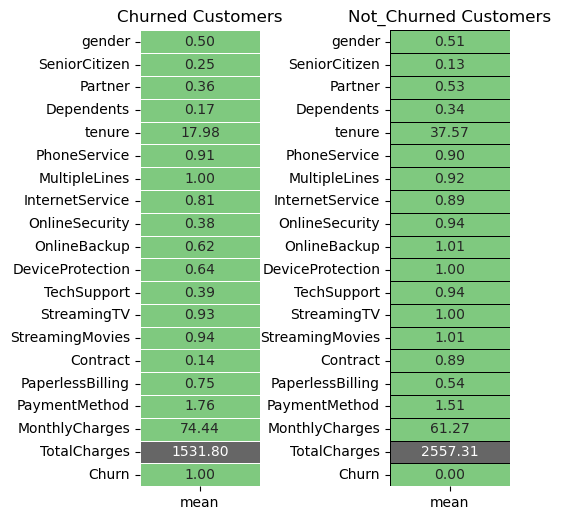

In [11]:
churn = df1[df1['Churn'] == 1].describe().T
not_churn = df1[df1['Churn'] == 0].describe().T

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (5,5))
plt.subplot(1,2,1)
sns.heatmap(churn[['mean']],annot = True,cmap = 'Accent',linewidths = 0.4,cbar = False,fmt = '.2f')
plt.title('Churned Customers');

plt.subplot(1,2,2)
sns.heatmap(not_churn[['mean']],annot = True,cmap = 'Accent',linewidths = 0.4,linecolor = 'black',cbar = False,fmt = '.2f',)
plt.title('Not_Churned Customers');

fig.tight_layout(pad = 0)

kode ini memberikan visualisasi perbandingan rata-rata antara kelompok pelanggan yang berhenti berlangganan(churn) dan yang tidak berhenti(Churn) menggunakan heatmap pada tiap fitur

# Persentase churn customer

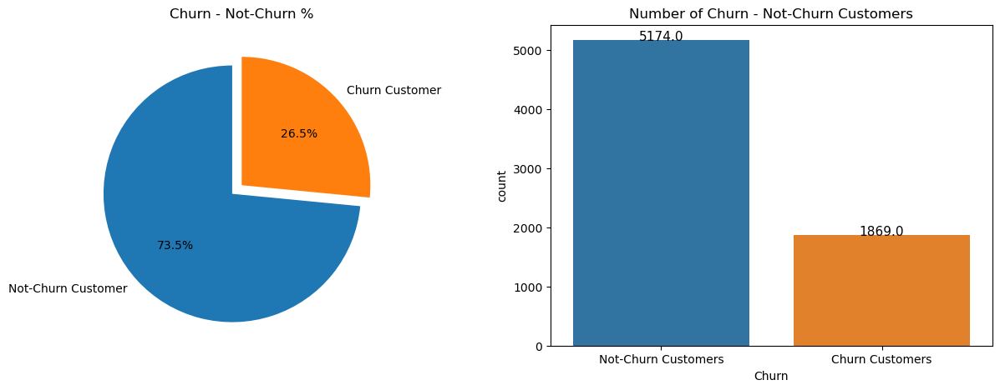

In [12]:
l = list(df1['Churn'].value_counts())
circle = [l[0] / sum(l) * 100, l[1] / sum(l) * 100]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Pie chart
axes[0].pie(circle, labels=['Not-Churn Customer', 'Churn Customer'], autopct='%1.1f%%', startangle=90, explode=(0.1, 0),
            wedgeprops={'antialiased': True})
axes[0].set_title('Churn - Not-Churn %')

# Count plot
axes[1] = sns.countplot(x='Churn', data=df1, ax=axes[1])
for rect in axes[1].patches:
    axes[1].text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(),
                 horizontalalignment='center', fontsize=11)
axes[1].set_xticklabels(['Not-Churn Customers', 'Churn Customers'])
axes[1].set_title('Number of Churn - Not-Churn Customers')

plt.show()

kode diatas digunakan untuk memvisualisasikan customer yang churn atau not churn

In [13]:
g_labels = ['Male', 'Female']
c_labels = ['No', 'Yes']
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=g_labels, values=df1['gender'].value_counts(), name="Gender"),
              1, 1)
fig.add_trace(go.Pie(labels=c_labels, values=df1['Churn'].value_counts(), name="Churn"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Gender and Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Gender', x=0.16, y=0.5, font_size=20, showarrow=False),
                 dict(text='Churn', x=0.84, y=0.5, font_size=20, showarrow=False)])
fig.show()

Kode ini menggunakan library Plotly untuk membuat visualisasi distribusi gender dan churn dalam bentuk pie charts. Pertama, dua set label ('Male', 'Female') dan ('No', 'Yes') disiapkan untuk representasi gender dan churn, masing-masing. Selanjutnya, subplots dibuat dengan spesifikasi menggunakan tipe 'domain' untuk pie charts.

Dua pie charts dimasukkan ke dalam subplot dengan menambahkan data menggunakan metode add_trace. Pie chart pertama menggambarkan distribusi gender dengan label 'Male' dan 'Female', sedangkan pie chart kedua menggambarkan distribusi churn dengan label 'No' dan 'Yes'.

In [14]:
categorical_features.remove('Churn')

menghapus churn pada variabel categorical

In [15]:
l1 = ['gender','SeniorCitizen','Partner','Dependents']
l2 = ['PhoneService','MultipleLines','InternetService','StreamingTV','StreamingMovies',
      'OnlineSecurity','OnlineBackup','DeviceProtection','TechSupport']
l3 = ['Contract','PaperlessBilling','PaymentMethod'] 

Kode ini membuat tiga list yang masing-masing berisi nama-nama fitur atau variabel yang dapat dianggap sebagai kelompok berdasarkan jenis informasi yang mereka bawa.

List l1:

Berisi fitur yang berkaitan dengan status personal pelanggan.
Contoh: 'gender' (jenis kelamin), 'SeniorCitizen' (status senior citizen), 'Partner' (status memiliki partner), 'Dependents' (status memiliki tanggungan).

List l2:

Berisi fitur yang terkait dengan layanan telekomunikasi.
Contoh: 'PhoneService' (status memiliki layanan telepon), 'MultipleLines' (status memiliki multiple lines), 'InternetService' (jenis layanan internet), 'StreamingTV' (status memiliki layanan streaming TV), 'StreamingMovies' (status memiliki layanan streaming film), 'OnlineSecurity' (status memiliki keamanan online), 'OnlineBackup' (status memiliki cadangan online), 'DeviceProtection' (status memiliki perlindungan perangkat), 'TechSupport' (status memiliki dukungan teknis).

List l3:

Berisi fitur yang terkait dengan jenis kontrak dan pembayaran.
Contoh: 'Contract' (jenis kontrak), 'PaperlessBilling' (status penggunaan tagihan tanpa kertas), 'PaymentMethod' (metode pembayaran).

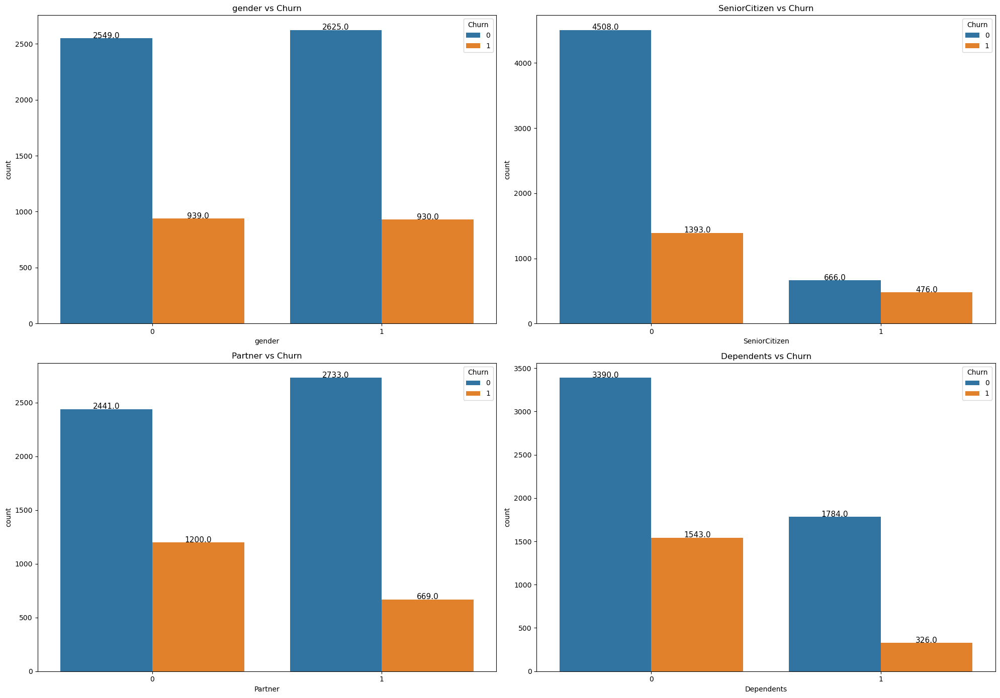

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 14))

for i, column in enumerate(l1):
    row, col = divmod(i, 2)
    ax = sns.countplot(x=column, data=df1, hue="Churn", ax=axes[row, col])
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize=11)
    title = f"{column} vs Churn"
    ax.set_title(title)

plt.tight_layout()
plt.show()

memvisualisasikan fitur yang churn pada masing masing fitur

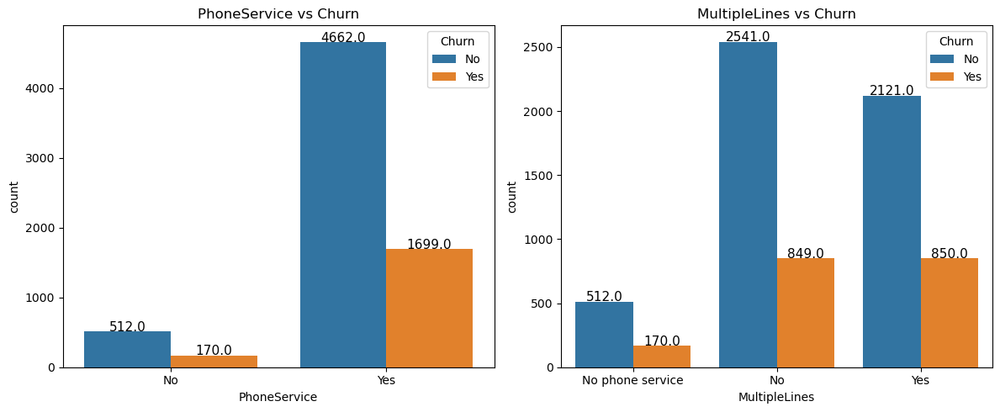

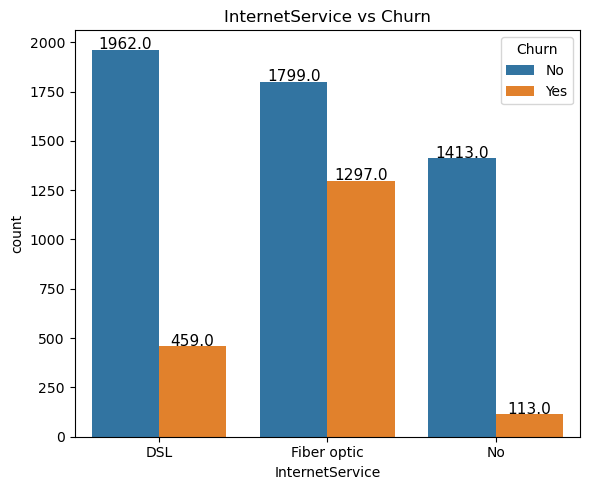

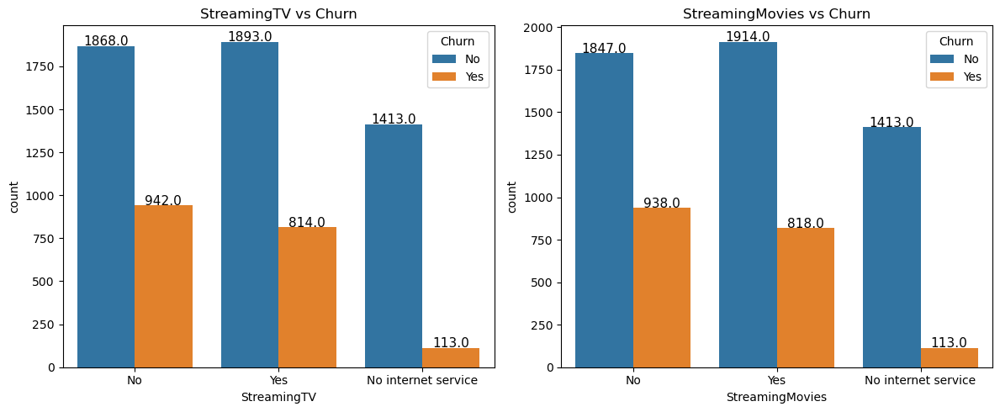

In [17]:
# Plot 1
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

for i in range(len(l2[0:2])):
    ax = axes[i]
    sns.countplot(x=l2[i], data=df, hue="Churn", ax=ax)
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(),
                horizontalalignment='center', fontsize=11)
    title = f"{l2[i]} vs Churn"
    ax.set_title(title)

plt.tight_layout()
plt.show()

# Plot 2
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 5))

sns.countplot(x=l2[2], data=df, hue="Churn", ax=ax)
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(),
            horizontalalignment='center', fontsize=11)
title = f"{l2[2]} vs Churn"
ax.set_title(title)

plt.tight_layout()
plt.show()

# Plot 3
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

for i in range(len(l2[3:5])):
    ax = axes[i]
    sns.countplot(x=l2[i + 3], data=df, hue="Churn", ax=ax)
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(),
                horizontalalignment='center', fontsize=11)
    title = f"{l2[i + 3]} vs Churn"
    ax.set_title(title)

plt.tight_layout()
plt.show()

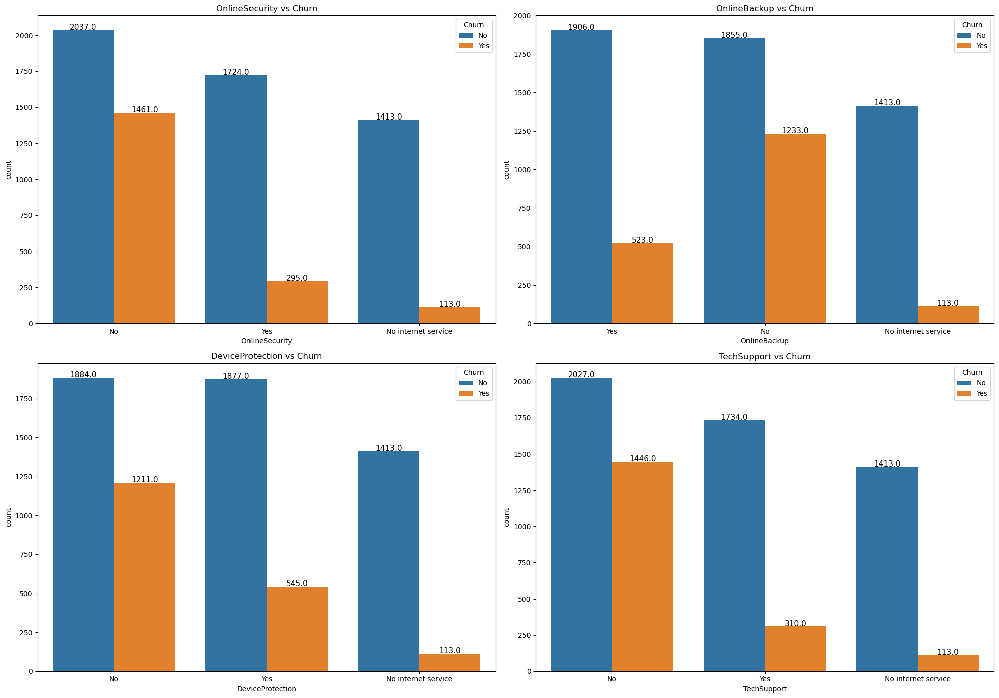

In [18]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 14))

for i in range(len(l2[-4:])):
    ax = axes[i // 2, i % 2]
    sns.countplot(x=l2[-4 + i], data=df, hue="Churn", ax=ax)
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(),
                horizontalalignment='center', fontsize=11)
    title = f"{l2[-4 + i]} vs Churn"
    ax.set_title(title)

plt.tight_layout()
plt.show()

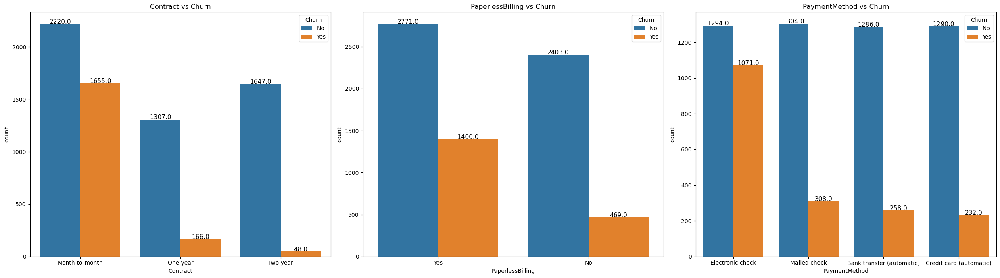

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(25, 7))

for i, column in enumerate(l3):
    ax = axes[i]
    sns.countplot(x=column, data=df, hue="Churn", ax=ax)
    for rect in ax.patches:
        ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(),
                horizontalalignment='center', fontsize=11)
    title = f"{column} vs Churn"
    ax.set_title(title)

plt.tight_layout()
plt.show()

In [20]:
gender = df1[df1['Churn'] == 1]['gender'].value_counts()
gender = [gender[0] / sum(gender) * 100, gender[1] / sum(gender) * 100] # Female / Male

seniorcitizen = df1[df1['Churn'] == 1]['SeniorCitizen'].value_counts()
seniorcitizen = [seniorcitizen[0] / sum(seniorcitizen) * 100,seniorcitizen[1] / sum(seniorcitizen) * 100] # No - Yes

partner = df1[df1['Churn'] == 1]['Partner'].value_counts()
partner = [partner[0] / sum(partner) * 100,partner[1] / sum(partner) * 100] # No - Yes

dependents = df1[df1['Churn'] == 1]['Dependents'].value_counts()
dependents = [dependents[0] / sum(dependents) * 100,dependents[1] / sum(dependents) * 100] # No - Yes

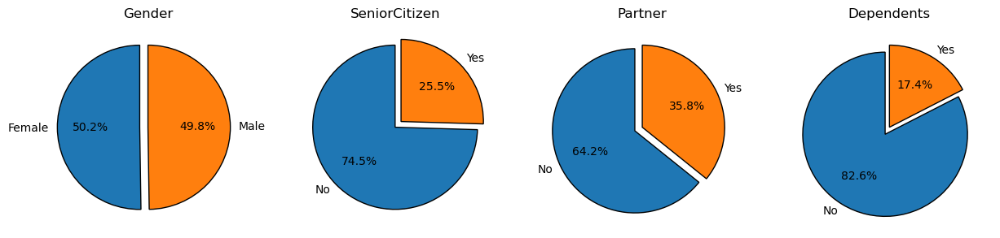

In [21]:
ax,fig = plt.subplots(nrows = 1,ncols = 4,figsize = (15,15))

plt.subplot(1,4,1)
plt.pie(gender,labels = ['Female','Male'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Gender');

plt.subplot(1,4,2)
plt.pie(seniorcitizen,labels = ['No', 'Yes'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1),
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('SeniorCitizen');

plt.subplot(1,4,3)
plt.pie(partner,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Partner');

plt.subplot(1,4,4)
plt.pie(dependents,labels = ['No','Yes'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),
       wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Dependents');

membuat visualisasi pie chart untuk melihat pembagian churn or not churn pada fitur fitur

In [23]:
df1["InternetService"].describe(include=['object', 'bool'])

count               7,043.00
mean                    0.87
std                     0.74
min                     0.00
25%                     0.00
50%                     1.00
75%                     1.00
max                     2.00
Name: InternetService, dtype: float64

melihat basic statistik pada kolom internetservice

In [24]:
df1.isnull().sum()

gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

kode diatas digunakan untuk mengecek data yang missing atau null pada dataset

In [25]:
df1.shape

(7043, 20)

kode diatas digunakan untuk melihat jumlah baris dan kolom pada dataset

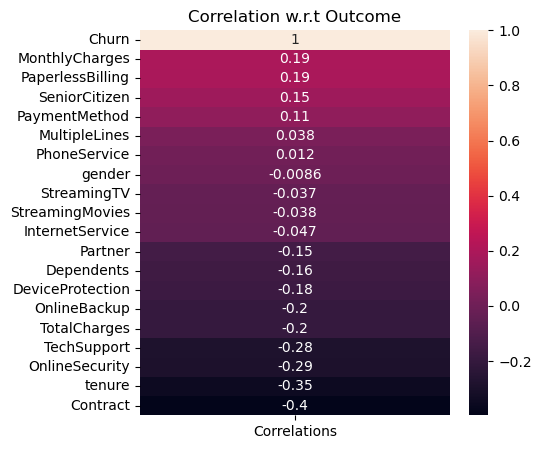

In [26]:
corr = df1.corrwith(df1['Churn']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlations']
plt.subplots(figsize = (5,5))
sns.heatmap(corr,annot = True);
plt.title('Correlation w.r.t Outcome');

Kode tersebut bertujuan untuk menghitung korelasi antara setiap fitur dalam DataFrame df1 dengan fitur target 'Churn'. Dalam statistika, korelasi mengukur sejauh mana dua variabel bergerak bersama-sama. Dalam konteks ini, kita ingin melihat sejauh mana setiap fitur berkorelasi dengan keputusan pelanggan untuk berhenti berlangganan ('Churn').

In [27]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2,mutual_info_classif

mengimport library untuk feature selection dengan selectKBest dan chi2

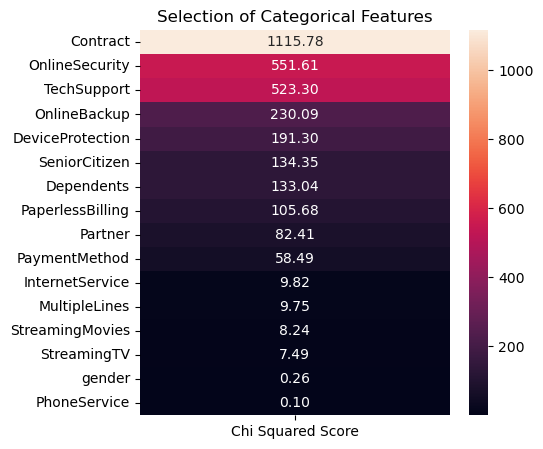

In [28]:
features = df1.loc[:,categorical_features]
target = df1.loc[:,'Churn']

best_features = SelectKBest(score_func = chi2,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,fmt = '.2f');
plt.title('Selection of Categorical Features');

Kode ini ditujukan untuk melakukan seleksi fitur pada data kategorikal menggunakan uji statistik Chi-squared (chi-square). Tujuan dari seleksi fitur ini adalah untuk menentukan fitur-fitur mana yang paling signifikan atau informatif dalam memprediksi variabel target 'Churn'.

Pertama, kode memisahkan fitur-fitur kategorikal dan target dari DataFrame utama dengan menggunakan df1.loc[:, categorical_features] untuk fitur dan df1.loc[:, 'Churn'] untuk target. Setelah itu, objek best_features dibuat menggunakan metode SelectKBest dari scikit-learn, dengan menyertakan fungsi skor chi2 sebagai kriteria seleksi.

Proses seleksi fitur dilakukan dengan memanggil fit pada objek best_features untuk menyelaraskan fitur-fitur dengan target. Hasil skor Chi-squared untuk setiap fitur disimpan dalam DataFrame featureScores dengan nama kolom 'Chi Squared Score'.

Visualisasi dibuat dengan menggunakan seaborn heatmap untuk menyoroti skor Chi-squared, dengan mengurutkan fitur-fitur berdasarkan skor tertinggi. Hal ini membantu dalam memahami sejauh mana setiap fitur memberikan informasi yang signifikan dalam konteks prediksi 'Churn'.

In [29]:
from sklearn.feature_selection import f_classif

kode diatas adalah library untuk menggunakan feature selection

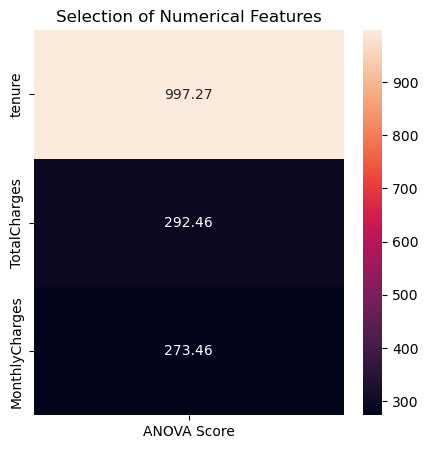

In [30]:
features = df1.loc[:,numerical_features]
target = df1.loc[:,'Churn']

best_features = SelectKBest(score_func = f_classif,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['ANOVA Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'ANOVA Score'),annot = True,fmt = '.2f');
plt.title('Selection of Numerical Features');

Kode ini bertujuan untuk melakukan seleksi fitur pada data numerikal menggunakan analisis statistik Anova F-statistic. Tujuan utama dari seleksi fitur ini adalah untuk mengidentifikasi fitur-fitur numerikal yang paling signifikan atau informatif dalam memprediksi variabel target 'Churn'.

Pertama, kode memisahkan fitur-fitur numerikal dan target dari DataFrame utama dengan menggunakan df1.loc[:, numerical_features] untuk fitur dan df1.loc[:, 'Churn'] untuk target. Setelah itu, objek best_features dibuat menggunakan metode SelectKBest dari scikit-learn, dengan menyertakan fungsi skor f_classif sebagai kriteria seleksi.

Proses seleksi fitur dilakukan dengan memanggil fit pada objek best_features untuk menyelaraskan fitur-fitur dengan target. Hasil skor Anova F-statistic untuk setiap fitur disimpan dalam DataFrame featureScores dengan nama kolom 'ANOVA Score'.

Visualisasi dibuat dengan menggunakan seaborn heatmap untuk menyoroti skor Anova F-statistic, dengan mengurutkan fitur-fitur berdasarkan skor tertinggi. 

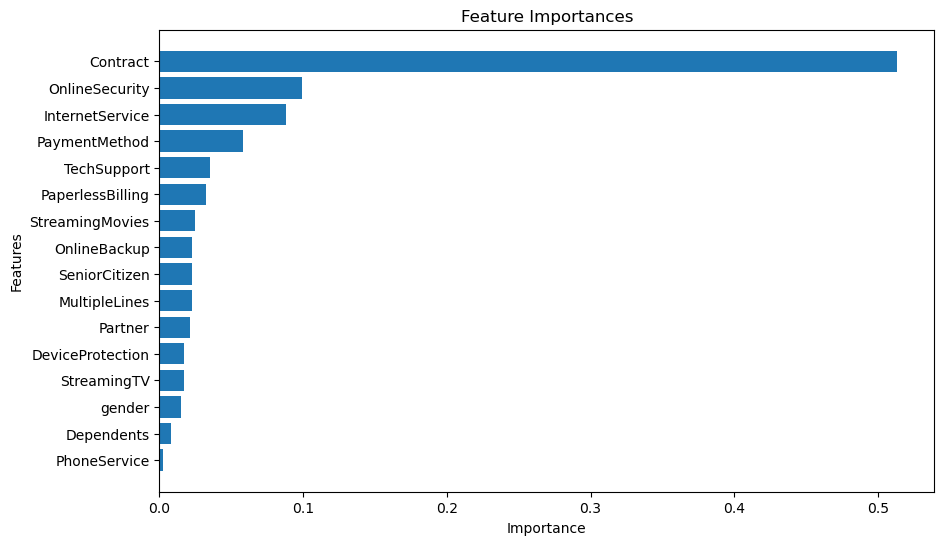

In [31]:
from sklearn.tree import DecisionTreeClassifier

features = df1.loc[:, categorical_features]
target = df1.loc[:, 'Churn']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.20)

classifier = DecisionTreeClassifier(random_state = 1000,criterion= 'entropy', max_depth= 15, min_samples_leaf= 5, min_samples_split= 48)
classifier.fit(X_train, y_train)

feature_importances = pd.DataFrame(classifier.feature_importances_, index=X_train.columns, columns=['importance']).sort_values('importance', ascending=True)

plt.figure(figsize=(10, 6))
plt.barh(feature_importances.index, feature_importances['importance'])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances')
plt.show()

Kode ini menggunakan Decision Tree Classifier dari scikit-learn untuk melakukan klasifikasi pada data. Tujuan utama adalah untuk memahami pentingnya setiap fitur dalam membuat keputusan prediktif terhadap variabel target 'Churn'.

In [32]:
df1.drop(columns = ['PhoneService', 'gender','StreamingTV','StreamingMovies','MultipleLines','InternetService'],inplace = True)
df1.head()

,SeniorCitizen,Partner,Dependents,tenure,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,1,0,1,0,2,0,0,0,1,2,29.85,29.85,0
1,0,0,0,34,2,0,2,0,1,0,3,56.95,"1,889.50",0
2,0,0,0,2,2,2,0,0,0,1,3,53.85,108.15,1
3,0,0,0,45,2,0,2,2,1,0,0,42.30,"1,840.75",0
4,0,0,0,2,0,0,0,0,0,1,2,70.70,151.65,1


men drop kolom ['PhoneService', 'gender','StreamingTV','StreamingMovies','MultipleLines','InternetService'] karena kolom tersebut kecil pada skor feature selection

In [33]:
import imblearn
from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

kode diatas adalah library untuk menggunakan pendistribusian normal pada data yaitu smote

In [34]:
over = SMOTE(sampling_strategy = 1)

f1 = df1.iloc[:,:13].values
t1 = df1.iloc[:,13].values

f1, t1 = over.fit_resample(f1, t1)
Counter(t1)

Counter({0: 5174, 1: 5174})

Kode ini menggunakan metode oversampling untuk menangani ketidakseimbangan kelas pada variabel target 'Churn'. Oversampling dilakukan menggunakan metode Synthetic Minority Over-sampling Technique (SMOTE) yang diimplementasikan melalui library imbalanced-learn. SMOTE bertujuan untuk meningkatkan jumlah sampel pada kelas minoritas dengan membuat sampel sintetis baru.

In [35]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve

library diatas adalah library untuk splitting data train dan data test dan juga beberapa library untuk melihat skor klasifikasi dan hyperparameter tuning

In [36]:
x_train, x_test, y_train, y_test = train_test_split(f1, t1, test_size = 0.20, random_state = 2)

membagi data train dan data test sebesar 80 : 20

In [37]:
def model(classifier,x_train,y_train,x_test,y_test):
    
    classifier.fit(x_train,y_train)
    prediction = classifier.predict(x_test)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 20,random_state = 1)
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,x_train,y_train,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(y_test,prediction)))
    RocCurveDisplay.from_estimator(classifier, x_test,y_test)
    plt.title('ROC_AUC_Plot')
    plt.show()

def model_evaluation(classifier,x_test,y_test):
    
    # Confusion Matrix
    cm = confusion_matrix(y_test,classifier.predict(x_test))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap = 'Blues',fmt ='')
    
    # Classification Report
    print(classification_report(y_test,classifier.predict(x_test)))

Fungsi model menerima model klasifikasi, data latih, dan data uji, melatih model, menghitung dan menampilkan skor AUC-ROC dari cross-validation, skor AUC-ROC pada data uji, serta menampilkan kurva ROC-AUC. Fungsi model_evaluation menerima model dan data uji, menghitung dan menampilkan confusion matrix, serta menampilkan classification report dengan informasi akurasi, presisi, recall, dan f1-score untuk setiap kelas. Kedua fungsi ini memberikan gambaran holistik tentang performa model klasifikasi dan membantu dalam interpretasi hasil prediksi pada dataset.

In [38]:
from sklearn.tree import DecisionTreeClassifier

kode diatas untuk import library machine learning decision tree classifier

In [56]:
classifier_dt = DecisionTreeClassifier(random_state = 1000,criterion= 'entropy', max_depth= 15, min_samples_leaf= 5, min_samples_split= 48)

mendefinisikan fungsi decision tree dengan parameter parameternya

Cross Validation Score :  90.65%
ROC_AUC Score :  82.69%


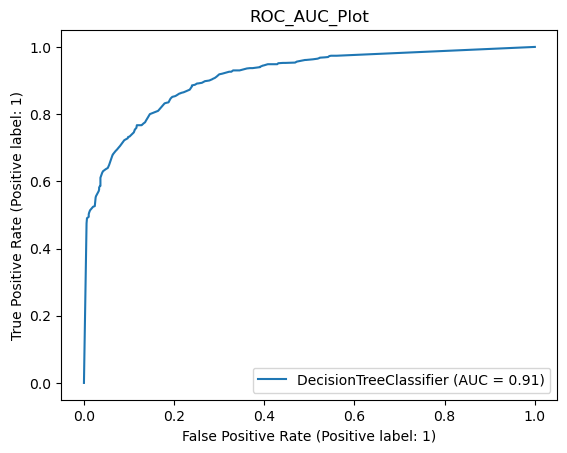

In [57]:
model(classifier_dt,x_train,y_train,x_test,y_test)

untuk melatih model yang sudah didefiniskan sebelumnya dan menampilkan score CV atau crossvalidation

              precision    recall  f1-score   support

           0       0.81      0.85      0.83      1040
           1       0.84      0.80      0.82      1030

    accuracy                           0.83      2070
   macro avg       0.83      0.83      0.83      2070
weighted avg       0.83      0.83      0.83      2070



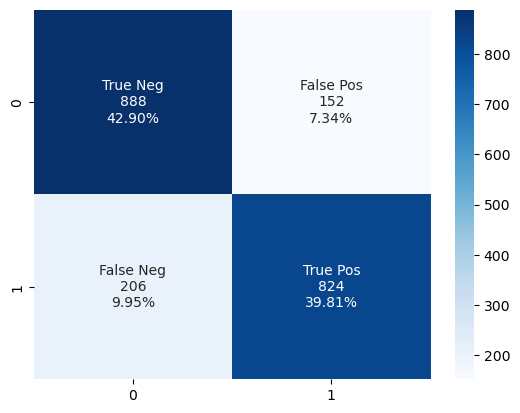

In [58]:
model_evaluation(classifier_dt,x_test,y_test)

evaluasi model dengan confussion matrix untuk melihat presentase True Negatif dan True Positif

In [42]:
from sklearn.model_selection import GridSearchCV

import library hyperparameter tuning GridCV

In [43]:
dt_hp = DecisionTreeClassifier(random_state=43)

params = {'max_depth':[3,5,7,10,15,20,30,40,50],
          'min_samples_leaf':[3,5,10,15,20,25,30,40,45,50],
          'min_samples_split':[8,10,12,18,20,16,20,27,32,48],
          'criterion':['gini','entropy','log_loss']}
GS = GridSearchCV(estimator=dt_hp,param_grid=params,cv=5,n_jobs=-1, verbose=True, scoring='accuracy')

menentukan parameter apa saja yang ingin dicoba

In [44]:
GS.fit(x_train, y_train)

Fitting 5 folds for each of 2700 candidates, totalling 13500 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=43), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [3, 5, 7, 10, 15, 20, 30, 40, 50],
                         'min_samples_leaf': [3, 5, 10, 15, 20, 25, 30, 40, 45,
                                              50],
                         'min_samples_split': [8, 10, 12, 18, 20, 16, 20, 27,
                                               32, 48]},
             scoring='accuracy', verbose=True)

memfitkan fitur dan target

In [45]:
print('Best Parameters:',GS.best_params_,end='\n\n')
print('Best Score:',GS.best_score_)

Best Parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 48}

Best Score: 0.827976414612432


mendapat best parameter dengan hyperparameter tuning

In [46]:
import dtreeviz.trees

library untuk visualisasi decision tree dan kawan kawannya

In [47]:
viz_model = dtreeviz.model(classifier_dt,x_train,y_train,x_test,y_test)
viz_model.view()


(process:10368): GLib-GIO-WARNING **: 21:36:01.438: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2309.16.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

(process:10368): GLib-GIO-WARNING **: 21:36:01.566: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.8.3.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:10368): GLib-GIO-WARNING **: 21:36:01.713: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2023.1108.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 1 extensions but has no verbs


melihat visualisasi decision tree yang sudah dibuat